## Download Bulk Data Files from PatentsView

In [1]:
from zipfile import ZipFile
from urllib.request import urlretrieve
import tempfile
import os

def extract_from_url(zipfile_url: str, filename: str, dir: str='.', overwrite: bool=False):
    """
    Extract file from zipped download url.
    """
    filepath = os.path.join(dir, filename)
    if overwrite or not os.path.exists(filepath):
        with tempfile.NamedTemporaryFile() as zipped:
            urlretrieve(zipfile_url, zipped.name)
            with ZipFile(zipped) as zipfile:
                zipfile.extract(filename)

    return filepath

In [2]:
tables = [
    "g_patent",
    "g_location_not_disambiguated",
    "g_assignee_not_disambiguated",
    "g_ipc_at_issue"
]
def download_tables(tables):
    """
    Download and extract list of tables from PatentsView's bulk data downloads.
    """
    base_url = "https://s3.amazonaws.com/data.patentsview.org/download"
    for table in tables:
        download_url = f"{base_url}/{table}.tsv.zip"
        filename = f"{table}.tsv"
        extract_from_url(download_url, filename)

download_tables(tables)

## Initialize Local DuckDB Database

### Create/Connect to DuckDB Database

In [3]:
import duckdb

con = duckdb.connect("patentsview.ddb")
con.execute('SET enable_progress_bar = false;')  # Avoid progress bar bugs on some systems.

### Create Tables in Database

In [4]:
def list_tables(con: duckdb.DuckDBPyConnection):
    """
    Returns list of table names in database.
    """
    return [row[0] for row in con.execute("show tables").fetchall()]

def create_tables_if_not_exist(con, tables):
    """
    Create DuckDB database tables from tsv files.
    """
    for table in tables:
        if table not in list_tables(con):
            con.read_csv(f"{table}.tsv", all_varchar= True).create(table)

create_tables_if_not_exist(con, tables)

## Preview Tables

In [5]:
g_patent = con.table("g_patent")
g_location_not_disambiguated = con.table("g_location_not_disambiguated")
g_assignee_not_disambiguated = con.table("g_assignee_not_disambiguated")
g_ipc_at_issue = con.table("g_ipc_at_issue")

In [6]:
g_patent.limit(2).df()

,patent_id,patent_type,patent_date,patent_title,wipo_kind,num_claims,withdrawn,filename
0,10000000,utility,2018-06-19,Coherent LADAR using intra-pixel quadrature de...,B2,20,0,ipg180619.xml
1,10000001,utility,2018-06-19,Injection molding machine and mold thickness c...,B2,12,0,ipg180619.xml


In [7]:
g_location_not_disambiguated.limit(2).df()

,rawlocation_id,location_id,raw_city,raw_state,raw_country
0,000005mtrirpdyrtlkfbffj0e,1d2251c8-16c8-11ed-9b5f-1234bde3cd05,Kanagawa,None,JP
1,00006fjnoq057no2s4bse374r,439af3dd-16c8-11ed-9b5f-1234bde3cd05,Dallas,TX,US


In [8]:
g_assignee_not_disambiguated.limit(2).df()

,patent_id,assignee_sequence,assignee_id,raw_assignee_individual_name_first,raw_assignee_individual_name_last,raw_assignee_organization,assignee_type,rawlocation_id
0,4488683,0,b12aba35-6fdd-4346-b7c0-8c7a157c8844,None,None,Metal Works Ramat David,3,b44f6bf0-1f14-4b25-9ab6-06945ff1e8e1
1,11872626,0,ee0744f6-d2d4-46f4-8be7-2758e096a6a9,None,None,"DIVERGENT TECHNOLOGIES, INC.",2,8zd6qm7aatxho9jcoihh78un1


In [9]:
g_ipc_at_issue.limit(2).df()

,patent_id,ipc_sequence,classification_level,section,ipc_class,subclass,main_group,subgroup,classification_value,classification_status,classification_data_source,action_date,ipc_version_indicator
0,6864832,0,None,G,01,S,013,/42,None,None,None,None,None
1,9954111,8,A,H,01,L,27,1156,I,B,H,2018-04-24,2017-01-01


## Joining Tables

In [10]:
# Join tables to create row of patent-assignee data
assignee_joined = (
    g_assignee_not_disambiguated
    .join(g_location_not_disambiguated, "rawlocation_id", how = "left")
    .join(g_patent, "patent_id", how = "left")
    .join(g_ipc_at_issue, "patent_id", how = "left")
)

assignee_joined.limit(1).df().columns

Index(['patent_id', 'assignee_sequence', 'assignee_id',
       'raw_assignee_individual_name_first',
       'raw_assignee_individual_name_last', 'raw_assignee_organization',
       'assignee_type', 'rawlocation_id', 'location_id', 'raw_city',
       'raw_state', 'raw_country', 'patent_type', 'patent_date',
       'patent_title', 'wipo_kind', 'num_claims', 'withdrawn', 'filename',
       'ipc_sequence', 'classification_level', 'section', 'ipc_class',
       'subclass', 'main_group', 'subgroup', 'classification_value',
       'classification_status', 'classification_data_source', 'action_date',
       'ipc_version_indicator'],
      dtype='object')

In [11]:
len(assignee_joined)

24008602

## Analyzing Biotechnology Patents

In [12]:
# Define criteria for the biotechnology IPC sections, classes, and subclasses
ipc_to_biotech = {
    "C07G": "Pharmaceuticals",
    "C12N": "Genetic Engineering",
    "C12Q": "Diagnostics & Biotechnology Tools",
    "C12P": "Industrial Biotechnology",
    "C07K": "Biopharmaceuticals",
    "C12M": "Biotechnology Instruments",
    "C40B": "Combinatorial Chemistry & Drug Discovery"
}

In [13]:
biotech_patents = (
    assignee_joined
    .query("_", "select *, section||ipc_class||subclass as biotech_code from _")
    .filter(f"biotech_code in {list(ipc_to_biotech.keys())}")
    .filter("assignee_sequence = 0")  # Only consider the first listed assignee on each patent
    .aggregate(",".join(f"first({col}) as {col}" for col in assignee_joined.columns), group_expr="patent_id,biotech_code")
    .fetchdf()
)

biotech_patents.head(2)

,patent_id,assignee_sequence,assignee_id,raw_assignee_individual_name_first,raw_assignee_individual_name_last,raw_assignee_organization,assignee_type,rawlocation_id,location_id,raw_city,...,section,ipc_class,subclass,main_group,subgroup,classification_value,classification_status,classification_data_source,action_date,ipc_version_indicator
0,9474730,0,e49d2e3a-a564-44b2-b104-7eabd28a42d7,None,None,BOARD OF REGENTS OF THE UNIVERSITY OF TEXAS SY...,2,0tf9dwkvkd4ijbxcs2m1bcfth,1811f8b9-16c8-11ed-9b5f-1234bde3cd05,Austin,...,C,12,Q,1,48,I,B,H,2016-10-25,2006-01-01
1,9701964,0,3f8f6612-154e-45be-84e8-1286665e0765,None,None,SNIPR TECHNOLOGIES LIMITED,3,0tfofejq1tra3lm5ucep3wz12,b38b1284-16c7-11ed-9b5f-1234bde3cd05,London,...,C,12,N,15,70,I,B,H,2017-07-11,2006-01-01


In [14]:
biotech_patents["biotech_category"] = biotech_patents["section"] + biotech_patents["ipc_class"] + biotech_patents["subclass"]
biotech_patents["biotech_field"] = biotech_patents["biotech_category"].map(ipc_to_biotech)
biotech_patents_counts = biotech_patents.groupby("biotech_field").size().reset_index(name="patent_count")

In [27]:
import plotly.express as px
import plotly.io as pio

pio.templates.default = 'plotly_white'
pio.renderers["png"].scale = 4

fig = px.histogram(
    biotech_patents, 
    x="biotech_field",
    title="Patent Counts for Selected Biotechnology Sectors",
    subtitle="Counts of patents granted between 1975 and September 30, 2024, and that include the given IPC classification code.",
    labels={"biotech_field": "Biotechnology Field", "count": "Number of Patents"},
    text_auto=True,
)
fig.update_xaxes(categoryorder="total descending")
fig.update_yaxes(title="Patent Count")

fig.show()

In [28]:
import pandas as pd

biotech_patents["year"] = pd.to_datetime(biotech_patents["patent_date"]).dt.year
df = biotech_patents.groupby(["year", "biotech_field"]).size().reset_index(name="count")

px.line(
    df,
    x="year",
    y="count",
    color="biotech_field",
    markers=True,
    title="Biotech Patent Trends Over Time",
    labels={"year": "Year", "count": "Patent Count", "biotech_field": "Biotech Field"}
)

classification of assignee (1 - Unassigned, 2 - US Company or Corporation, 3 - Foreign Company or Corporation, 4 - US Individual, 5 - Foreign Individual, 6 - US Federal Government, 7 - Foreign Government, 8 - US County Government, 9 - US State Government). Note: A "1" appearing before any of these codes signifies part interest

## Patent Types

In [29]:
assignee_types = {
    '1': 'Unassigned',
    '2': 'US Company',
    '3': 'Foreign Company',
    '4': 'US Individual',
    '5': 'Foreign Individual',
    '6': 'US Federal Govt',
    '7': 'Foreign Govt',
    '8': 'US County Govt',
    '9': 'US State Govt',
}
assignee_types.update({'1'+code: label+" (part interest)" for code, label in assignee_types.items()})

In [30]:
biotech_patents["assignee_label"] = biotech_patents["assignee_type"].map(assignee_types)
(
    biotech_patents
    .groupby(["assignee_label"])
    .size()
    .reset_index(name="count")
    .sort_values("count", ascending=False)
)

,assignee_label,count
5,US Company,165385
0,Foreign Company,101621
8,US Federal Govt,4310
2,Foreign Govt,1308
3,Foreign Individual,988
9,US Individual,509
11,US State Govt,106
6,US Company (part interest),14
1,Foreign Company (part interest),12
10,US Individual (part interest),5


## State Maps

In [31]:
state_abbreviation_to_name = {
    'AL': 'Alabama', 'AK': 'Alaska', 'AZ': 'Arizona', 'AR': 'Arkansas', 'CA': 'California', 
    'CO': 'Colorado', 'CT': 'Connecticut', 'DE': 'Delaware', 'FL': 'Florida', 'GA': 'Georgia',
    'HI': 'Hawaii', 'ID': 'Idaho', 'IL': 'Illinois', 'IN': 'Indiana', 'IA': 'Iowa', 
    'KS': 'Kansas', 'KY': 'Kentucky', 'LA': 'Louisiana', 'ME': 'Maine', 'MD': 'Maryland', 
    'MA': 'Massachusetts', 'MI': 'Michigan', 'MN': 'Minnesota', 'MS': 'Mississippi', 'MO': 'Missouri',
    'MT': 'Montana', 'NE': 'Nebraska', 'NV': 'Nevada', 'NH': 'New Hampshire', 'NJ': 'New Jersey',
    'NM': 'New Mexico', 'NY': 'New York', 'NC': 'North Carolina', 'ND': 'North Dakota', 'OH': 'Ohio',
    'OK': 'Oklahoma', 'OR': 'Oregon', 'PA': 'Pennsylvania', 'RI': 'Rhode Island', 'SC': 'South Carolina',
    'SD': 'South Dakota', 'TN': 'Tennessee', 'TX': 'Texas', 'UT': 'Utah', 'VT': 'Vermont', 
    'VA': 'Virginia', 'WA': 'Washington', 'WV': 'West Virginia', 'WI': 'Wisconsin', 'WY': 'Wyoming'
}

US_biotech_patents = biotech_patents.loc[biotech_patents["raw_country"] == 'US'].copy()
US_biotech_patents["assignee_state_name"] = US_biotech_patents["raw_state"].map(state_abbreviation_to_name)

state_counts = (
    US_biotech_patents
    .groupby(["assignee_state_name", "raw_state"])
    .size()
    .reset_index(name="patent_count")
)

state_counts.sort_values("patent_count", ascending=False).head()

,assignee_state_name,raw_state,patent_count
4,California,CA,48134
20,Massachusetts,MA,18644
31,New York,NY,11871
29,New Jersey,NJ,9089
24,Missouri,MO,6240


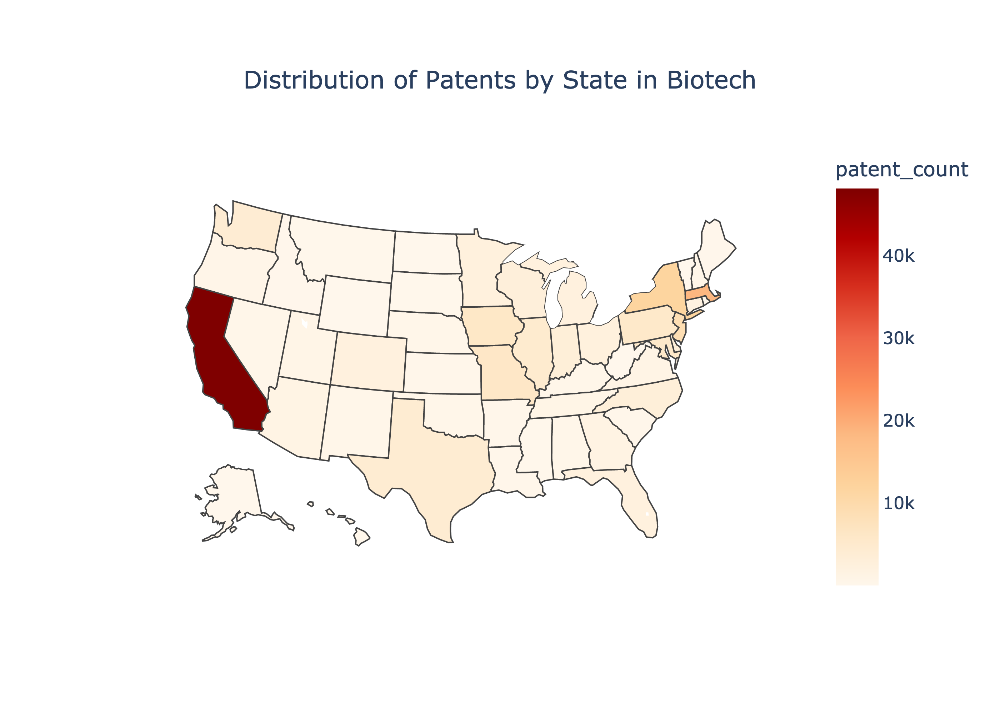

In [32]:
fig = px.choropleth(
    state_counts,
    locations="raw_state",
    locationmode="USA-states",
    color="patent_count",
    hover_name="assignee_state_name",
    color_continuous_scale="OrRd",
    scope="usa",
    title=f"Distribution of Patents by State"
)

fig.update_layout(
    title={
        "text": f"Distribution of Patents by State in Biotech",
        "x": 0.5,  # Center title
        "xanchor": "center",
        "yanchor": "top"
    }
)

fig.show(renderer="png")

https://www.census.gov/data/tables/time-series/demo/popest/2020s-state-total.html

In [33]:
state_population = pd.read_csv("resources/NST-EST2024-POP-extract.csv")
state_population.head()

,State,2024
0,Alabama,5157699
1,Alaska,740133
2,Arizona,7582384
3,Arkansas,3088354
4,California,39431263


In [34]:
rel_state_counts = state_counts.merge(state_population, how="left", left_on="assignee_state_name", right_on="State", validate="1:1")

rel_state_counts["count_per_thousand"] = 1000 * rel_state_counts["patent_count"] / rel_state_counts["2024"]

rel_state_counts.head()

,assignee_state_name,raw_state,patent_count,State,2024,count_per_thousand
0,Alabama,AL,507,Alabama,5157699,0.098300
1,Alaska,AK,28,Alaska,740133,0.037831
2,Arizona,AZ,1306,Arizona,7582384,0.172241
3,Arkansas,AR,344,Arkansas,3088354,0.111386
4,California,CA,48134,California,39431263,1.220707


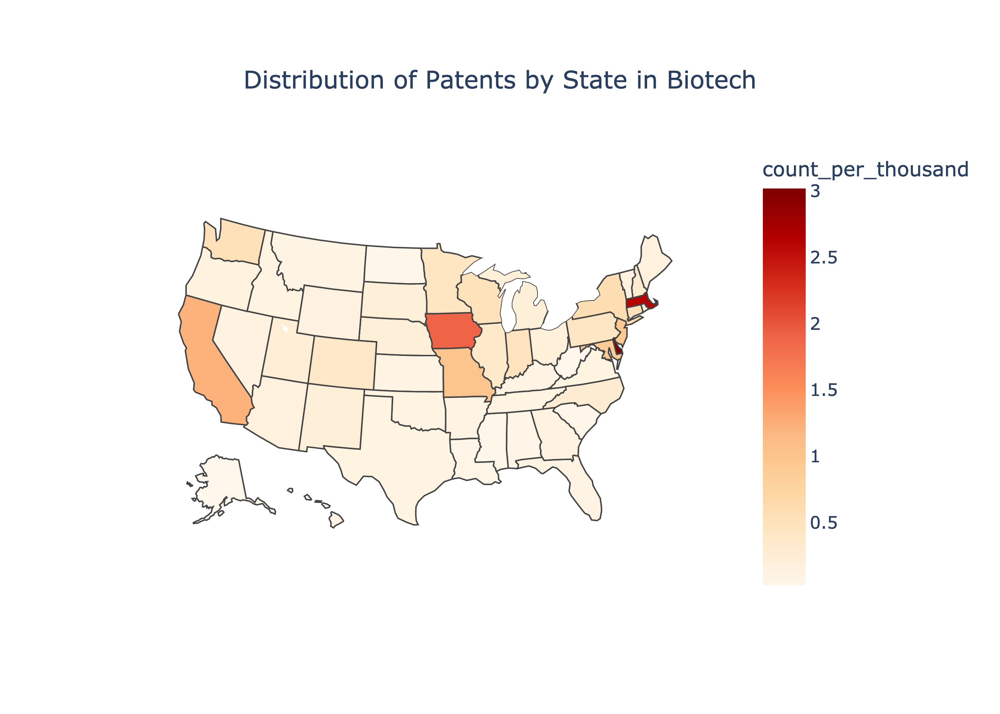

In [35]:
fig = px.choropleth(
    rel_state_counts,
    locations="raw_state",
    locationmode="USA-states",
    color="count_per_thousand",
    hover_name="assignee_state_name",
    color_continuous_scale="OrRd",
    scope="usa",
    title=f"Distribution of Patents by State"
)

fig.update_layout(
    title={
        "text": f"Distribution of Patents by State in Biotech",
        "x": 0.5,
        "xanchor": "center",
        "yanchor": "top"
    }
)

fig.show(renderer="png")